In [11]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

---

# 1. Loading data

In [5]:
df = pd.read_excel("../../data/Dry_Bean_Dataset.xlsx")
df.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


---

# 2. Data statistics

In [8]:
# checking dtype and null fields
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [9]:
# data statistic
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


---

# 3. Basic plots

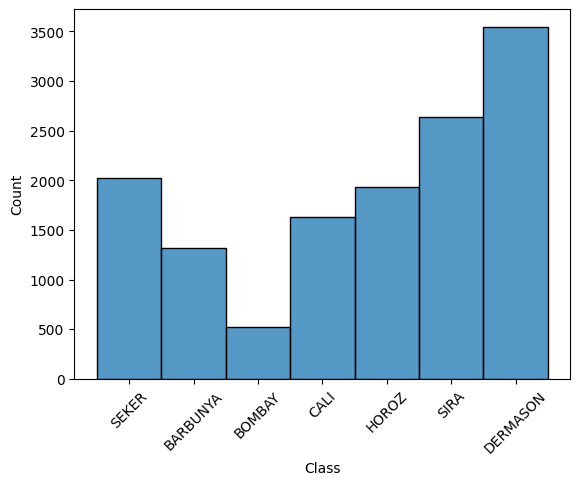

In [17]:
# 1. Class distribution
sns.histplot(df["Class"])
plt.xticks(rotation=45)
plt.show()

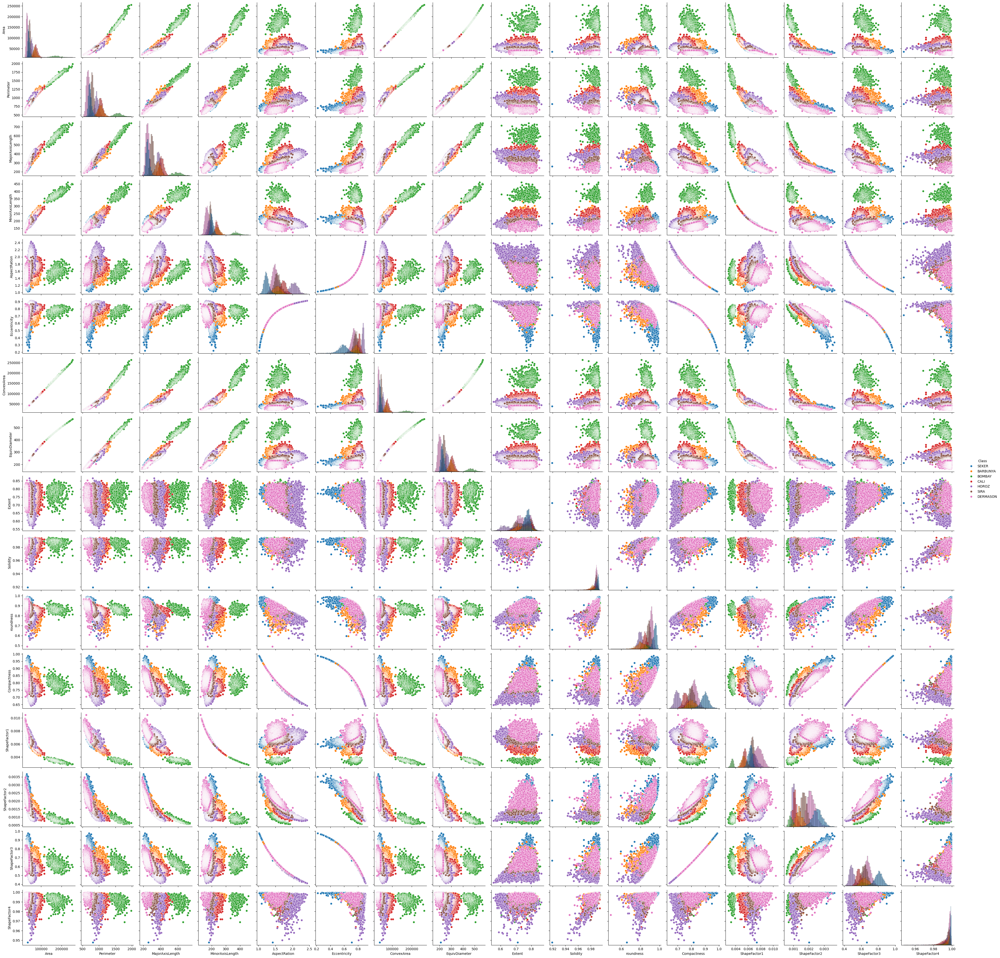

In [19]:
# 2. Histograms of the distribution of features in each class
sns.pairplot(df, hue="Class", diag_kind="hist")

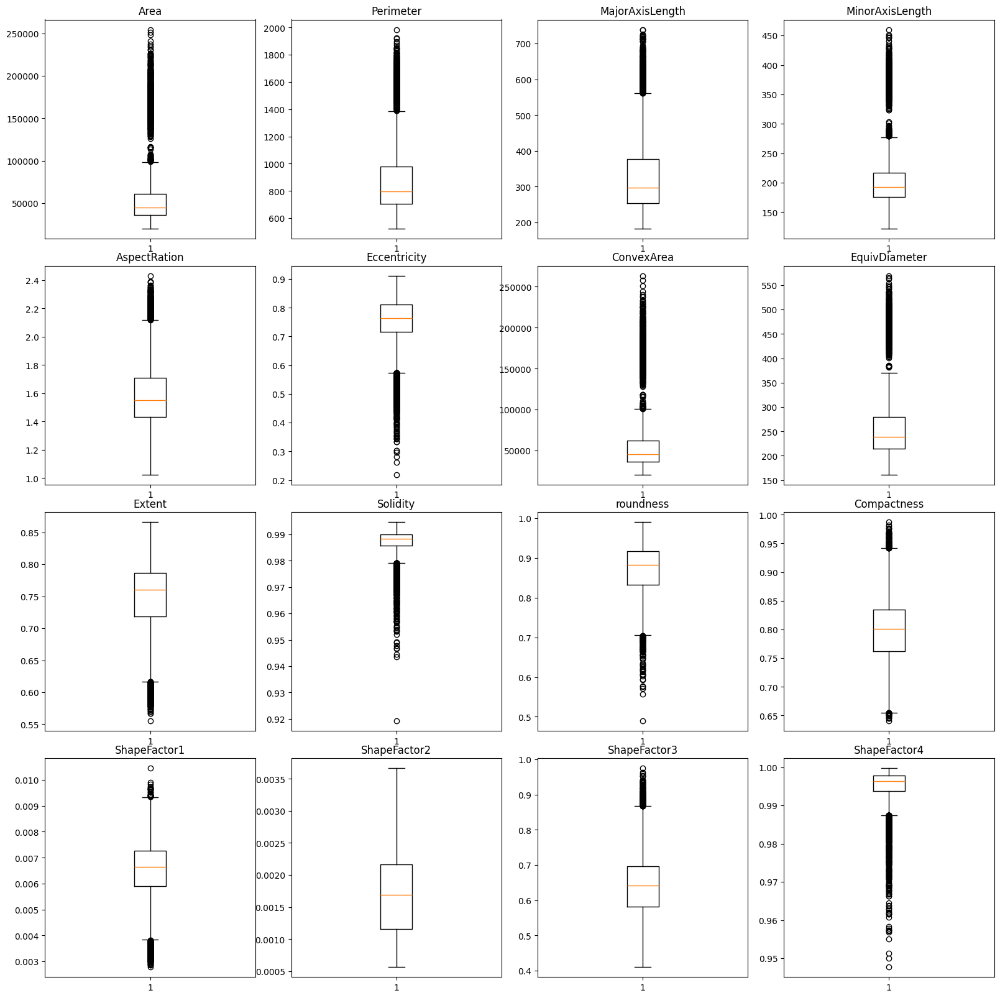

In [47]:
nfeatures = df.shape[1] - 1

fig, ax = plt.subplots(4, 4, figsize=(16, 16))
fig.tight_layout()
for i in range(nfeatures // 4):
    for j in range(nfeatures // 4):
        ax[i][j].boxplot(df[df.columns[i * 4 + j]])
        ax[i][j].set_title(df.columns[i * 4 + j])

---

# 4. Norm (lognorm) distribution tests

In [76]:
from statsmodels.stats.diagnostic import kstest_normal

# Kolmogorov-Smirnov test
nfeatures = df.shape[1] - 1

for feature in df.drop(["Class"], axis=1).columns:
    ksstatfloat, pvalue = kstest_normal(df[feature], dist='norm', pvalmethod='table')
    print(f"Feature {feature}: p-value = {round(pvalue, 4)}")

Feature Area: p-value = 0.001
Feature Perimeter: p-value = 0.001
Feature MajorAxisLength: p-value = 0.001
Feature MinorAxisLength: p-value = 0.001
Feature AspectRation: p-value = 0.001
Feature Eccentricity: p-value = 0.001
Feature ConvexArea: p-value = 0.001
Feature EquivDiameter: p-value = 0.001
Feature Extent: p-value = 0.001
Feature Solidity: p-value = 0.001
Feature roundness: p-value = 0.001
Feature Compactness: p-value = 0.001
Feature ShapeFactor1: p-value = 0.001
Feature ShapeFactor2: p-value = 0.001
Feature ShapeFactor3: p-value = 0.001
Feature ShapeFactor4: p-value = 0.001


For each feature, the hypothesis of the normality of the distribution is rejected

---

# 5. Outliers detection

Using ABOD, since the dimension of the features is relatively large (the curse of dimension)

In [83]:
from pyod.models.abod import ABOD

# we select 5 percent of the "outliers"
abod_detector = ABOD(contamination=0.05, n_neighbors=10, method='fast')
outliers = abod_detector.fit_predict(df.drop(["Class"], axis=1).to_numpy())
outliers

/Users/nikolajfonov/Programming/GitRepositories/comparison-of-bayesian-classifiers/.venv/lib/python3.11/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function fit_predict is deprecated
  warnings.warn(msg, category=FutureWarning)


array([0, 0, 0, ..., 0, 0, 0])

In [88]:
df_with_detected_outliers = pd.concat([df, pd.DataFrame(outliers, columns=["is_outlier"])], axis=1)
df_with_detected_outliers.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class,is_outlier
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER,0
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER,0
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER,0
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER,0
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER,0


---

# 6. Feature engineering

In [93]:
# We remove the signs that correlate with each other (|corr| > 0.95)
CORR_THRESHOLD = 0.95

corr_matrix = df.drop(["Class"], axis=1).corr()
to_merge = corr_matrix[(corr_matrix > CORR_THRESHOLD) | (corr_matrix < - CORR_THRESHOLD)]

to_merge_dict = {}

for col in to_merge:
    tm = to_merge[col].dropna().index.to_list()
    tm = [el for el in tm if el != col]
    if tm:
        to_merge_dict[col] = tm
to_merge_dict

{'Area': ['Perimeter', 'MinorAxisLength', 'ConvexArea', 'EquivDiameter'],
 'Perimeter': ['Area', 'MajorAxisLength', 'ConvexArea', 'EquivDiameter'],
 'MajorAxisLength': ['Perimeter', 'EquivDiameter'],
 'MinorAxisLength': ['Area', 'ConvexArea'],
 'AspectRation': ['Compactness', 'ShapeFactor3'],
 'Eccentricity': ['Compactness', 'ShapeFactor3'],
 'ConvexArea': ['Area', 'Perimeter', 'MinorAxisLength', 'EquivDiameter'],
 'EquivDiameter': ['Area', 'Perimeter', 'MajorAxisLength', 'ConvexArea'],
 'Compactness': ['AspectRation', 'Eccentricity', 'ShapeFactor3'],
 'ShapeFactor3': ['AspectRation', 'Eccentricity', 'Compactness']}

In [97]:
# Features to del
features_to_del = [
    'Perimeter', 'MajorAxisLength', 'MinorAxisLength', 'ConvexArea', 'EquivDiameter', 'AspectRation', 'Eccentricity', 'ShapeFactor3'
]
df_cleande_features = df.drop(features_to_del, axis=1)
df_cleande_features.head()

,Area,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor4,Class
0,28395,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.998724,SEKER
1,28734,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.998430,SEKER
2,29380,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.999066,SEKER
3,30008,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.994199,SEKER
4,30140,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.999166,SEKER


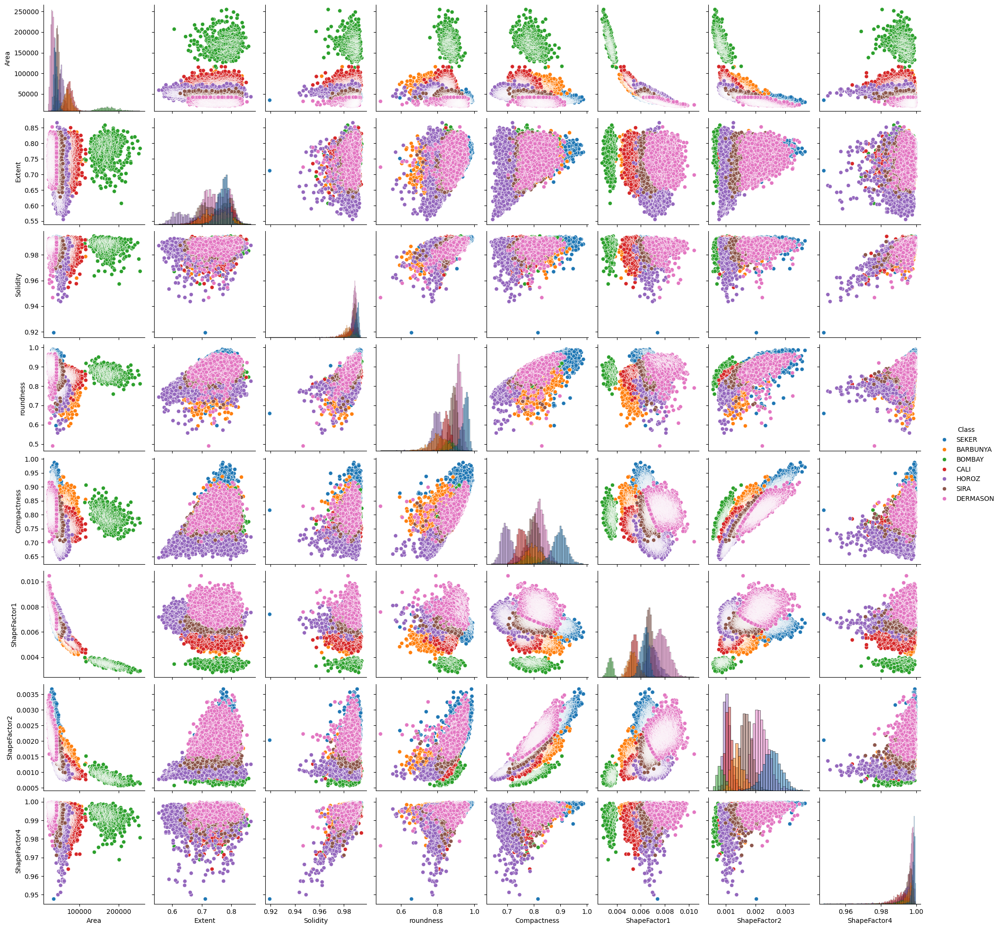

In [98]:
# Histograms of the distribution of features in each class after removing
sns.pairplot(df_cleande_features, hue="Class", diag_kind="hist")